In [450]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from datetime import datetime, timedelta
from sklearn.metrics import adjusted_rand_score
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer
from mpl_toolkits.mplot3d import Axes3D
import plotly.io as pio
import warnings
warnings.filterwarnings('ignore')


In [451]:
data = pd.read_csv('./données_exp.csv', sep=',', parse_dates=['order_purchase_timestamp'])


In [452]:
data

,order_id,customer_unique_id,order_purchase_timestamp,total_value
0,00e7ee1b050b8499577073aeb2a297a1,861eff4711a542e4b93843c6dd7febb0,2017-05-16 15:05:35,146.87
1,c1d2b34febe9cd269e378117d6681172,9eae34bbd3a474ec5d07949ca7de67c0,2017-11-09 00:50:13,137.89
2,c1d2b34febe9cd269e378117d6681172,9eae34bbd3a474ec5d07949ca7de67c0,2017-11-09 00:50:13,137.89
3,b1a5d5365d330d10485e0203d54ab9e8,3c799d181c34d51f6d44bbbc563024db,2017-05-07 20:11:26,140.61
4,2e604b3614664aa66867856dba7e61b7,23397e992b09769faf5e66f9e171a241,2018-02-03 19:45:40,137.58
...,...,...,...,...
115604,edcf1e1eeb52381be9388c90152be52d,c5da6424f1f5decedef8672a1a0103e1,2018-08-21 11:29:05,314.32
115605,2ef4a11b6e24fdfbb43b92cb5f95edff,8d80e477643ec569b24592ce3d9dfc4c,2018-07-23 18:35:14,31.86
115606,2ef4a11b6e24fdfbb43b92cb5f95edff,8d80e477643ec569b24592ce3d9dfc4c,2018-07-23 18:35:14,52.77
115607,2c12150c742ae2fa48bc703964c16c5f,8c3c961a52bb5a0ffbce1d4e6d25cd67,2018-07-28 17:55:27,77.50


In [453]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115609 entries, 0 to 115608
Data columns (total 4 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   order_id                  115609 non-null  object        
 1   customer_unique_id        115609 non-null  object        
 2   order_purchase_timestamp  115609 non-null  datetime64[ns]
 3   total_value               115609 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 3.5+ MB


# RFM Analysis

In [454]:
#Calculation of metrics Recency, Frequency, Monetery

def calculate_rfm_values(data):
    
    monetary = data.groupby('customer_unique_id')['total_value'].sum()
    
    frequency = data.groupby('customer_unique_id')['order_id'].nunique()
    
    last_purchase = data.groupby('customer_unique_id')['order_purchase_timestamp'].max()
    recency = (last_purchase.max() - last_purchase).dt.days
    
    rfm_data = pd.DataFrame({'recency': recency, 'frequency': frequency, 'monetary': monetary})

    return rfm_data


In [455]:
def standardize_data(data):
    scaler = StandardScaler()
    standardized_data = scaler.fit_transform(data)

    # Transform the numpy array back into a pandas dataframe
    standardized_data = pd.DataFrame(standardized_data, index=data.index, columns=data.columns)
    
    return standardized_data


In [456]:
rfm_data = calculate_rfm_values(data)
rfm_data

,recency,frequency,monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19
0000f46a3911fa3c0805444483337064,541,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62
0004aac84e0df4da2b147fca70cf8255,292,1,196.89
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,451,1,2067.42
fffea47cd6d3cc0a88bd621562a9d061,266,1,84.58
ffff371b4d645b6ecea244b27531430a,572,1,112.46


In [457]:
RFM_standardized_data = standardize_data(rfm_data)
RFM_standardized_data

,recency,frequency,monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.827507,-0.160426,-0.122512
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.807920,-0.160426,-0.558480
0000f46a3911fa3c0805444483337064,1.953827,-0.160426,-0.334130
0000f6ccb0745a6a4b88665a16c9f078,0.543573,-0.160426,-0.496036
0004aac84e0df4da2b147fca70cf8255,0.328117,-0.160426,0.086484
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1.366221,-0.160426,7.195644
fffea47cd6d3cc0a88bd621562a9d061,0.158365,-0.160426,-0.340363
ffff371b4d645b6ecea244b27531430a,2.156224,-0.160426,-0.234402


In [458]:
rfm_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 93396 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   recency    93396 non-null  int32  
 1   frequency  93396 non-null  int64  
 2   monetary   93396 non-null  float64
dtypes: float64(1), int32(1), int64(1)
memory usage: 2.5+ MB


In [459]:
rfm_data.describe()

,recency,frequency,monetary
count,93396.000000,93396.000000,93396.000000
mean,241.744250,1.033406,174.134824
std,153.164721,0.208235,263.116852
min,0.000000,1.000000,10.070000
25%,118.000000,1.000000,64.000000
50%,222.000000,1.000000,110.440000
75%,351.000000,1.000000,189.000000
max,728.000000,15.000000,13664.080000


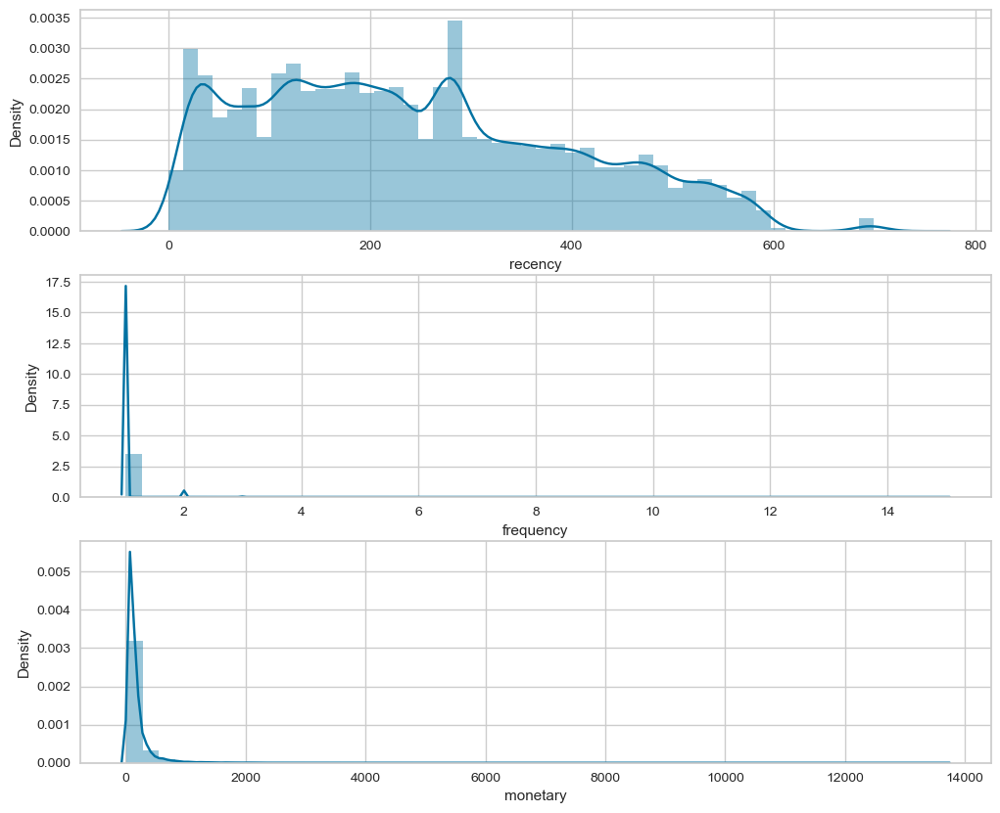

In [460]:
plt.figure(figsize=(12, 10))
plt.subplot(3, 1, 1); sns.distplot(rfm_data['recency'])
plt.subplot(3, 1, 2); sns.distplot(rfm_data['frequency'])
plt.subplot(3, 1, 3); sns.distplot(rfm_data['monetary'])
plt.show()

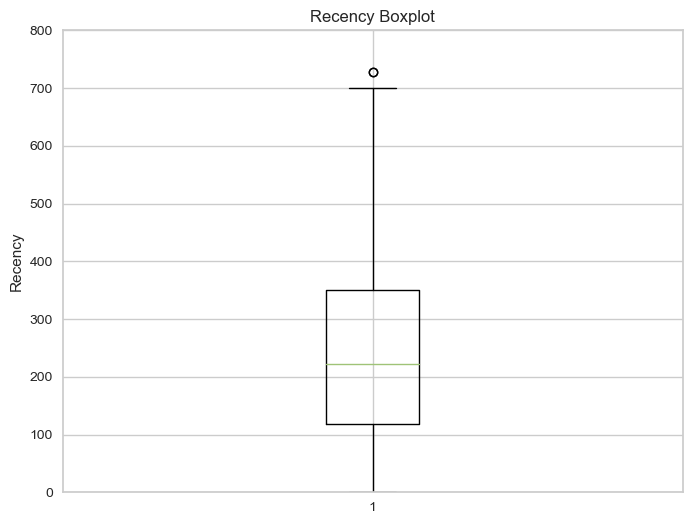

In [461]:
# boxplot - Recency
plt.figure(figsize=(8, 6))
plt.boxplot(rfm_data['recency'])
plt.title('Recency Boxplot')
plt.ylabel('Recency')
plt.ylim(0, 800)
plt.show()


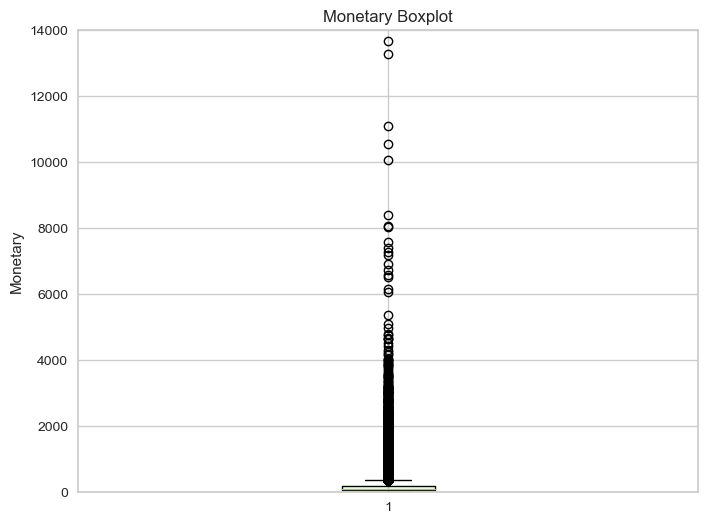

In [462]:
# boxplot - Monetary
plt.figure(figsize=(8, 6))
plt.boxplot(rfm_data['monetary'])
plt.title('Monetary Boxplot')
plt.ylabel('Monetary')
plt.ylim(0, 14000)
plt.show()


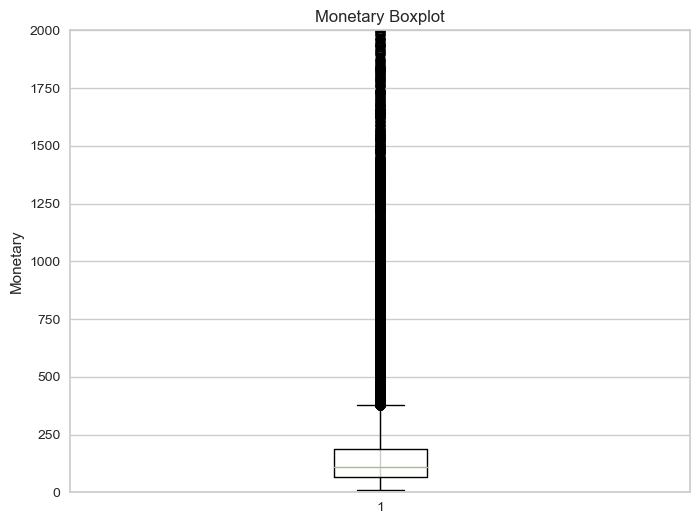

In [463]:
# boxplot - Monetary
plt.figure(figsize=(8, 6))
plt.boxplot(rfm_data['monetary'])
plt.title('Monetary Boxplot')
plt.ylabel('Monetary')
plt.ylim(0, 2000)
plt.show()


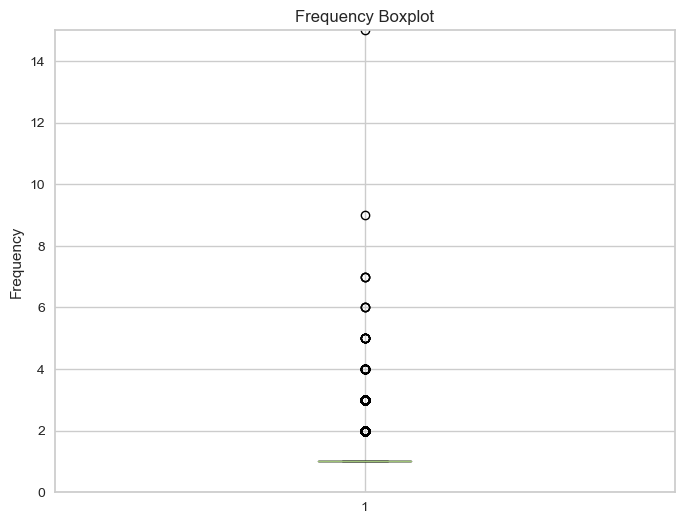

In [464]:
# boxplot - Frequency
plt.figure(figsize=(8, 6))
plt.boxplot(rfm_data['frequency'])
plt.title('Frequency Boxplot')
plt.ylabel('Frequency')
plt.ylim(0, 15)
plt.show()


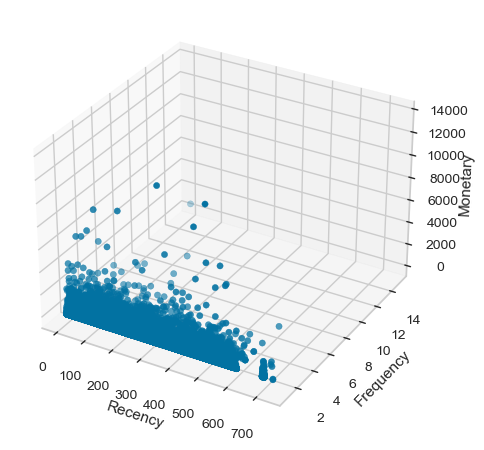

In [465]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(rfm_data['recency'], rfm_data['frequency'], rfm_data['monetary'])
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')

plt.show()

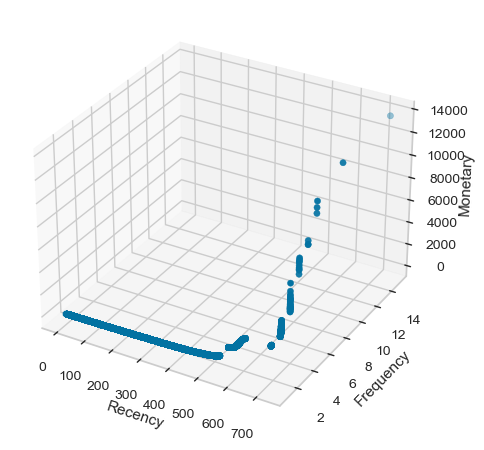

In [466]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# assuming recency, frequency, and monetary are NumPy arrays or list-like objects

ax.scatter(recency, frequency, monetary)
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')

plt.show()


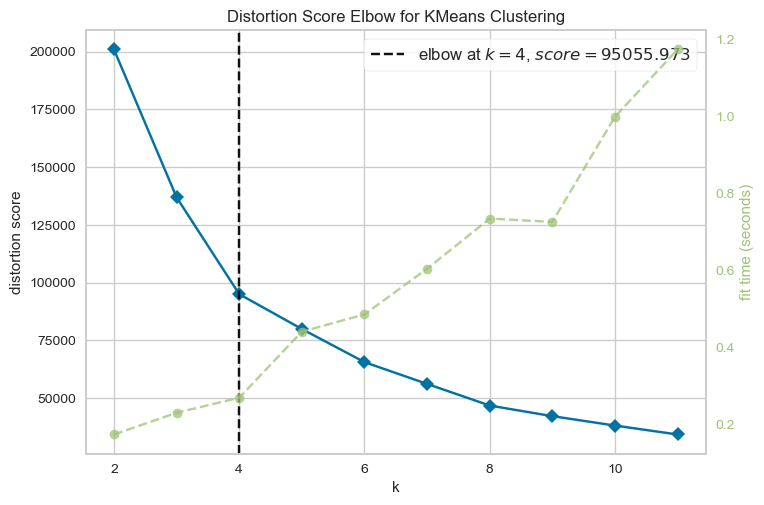

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [467]:
# Metode de coude
from yellowbrick.cluster import KElbowVisualizer
kmeans=KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,12))
visualizer.fit(RFM_standardized_data)
plt.savefig('my_figure1.png')
visualizer.show()

In [468]:
kmeans = KMeans(n_clusters=4, random_state=42) 
rfm_clustered = kmeans.fit_predict(RFM_standardized_data) 

In [469]:
rfm_clustered

array([3, 3, 0, ..., 0, 3, 0], dtype=int32)

In [470]:
RFM_standardized_data['Cluster'] = kmeans.labels_
RFM_standardized_data


,recency,frequency,monetary,Cluster
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.827507,-0.160426,-0.122512,3
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.807920,-0.160426,-0.558480,3
0000f46a3911fa3c0805444483337064,1.953827,-0.160426,-0.334130,0
0000f6ccb0745a6a4b88665a16c9f078,0.543573,-0.160426,-0.496036,0
0004aac84e0df4da2b147fca70cf8255,0.328117,-0.160426,0.086484,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1.366221,-0.160426,7.195644,2
fffea47cd6d3cc0a88bd621562a9d061,0.158365,-0.160426,-0.340363,0
ffff371b4d645b6ecea244b27531430a,2.156224,-0.160426,-0.234402,0


In [471]:
rfm_data['Cluster'] = kmeans.labels_
rfm_data

,recency,frequency,monetary,Cluster
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,3
0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,3
0000f46a3911fa3c0805444483337064,541,1,86.22,0
0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,0
0004aac84e0df4da2b147fca70cf8255,292,1,196.89,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,451,1,2067.42,2
fffea47cd6d3cc0a88bd621562a9d061,266,1,84.58,0
ffff371b4d645b6ecea244b27531430a,572,1,112.46,0


In [472]:
RFM_df=rfm_data.copy()

In [473]:
RFM_df

,recency,frequency,monetary,Cluster
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,3
0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,3
0000f46a3911fa3c0805444483337064,541,1,86.22,0
0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,0
0004aac84e0df4da2b147fca70cf8255,292,1,196.89,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,451,1,2067.42,2
fffea47cd6d3cc0a88bd621562a9d061,266,1,84.58,0
ffff371b4d645b6ecea244b27531430a,572,1,112.46,0


In [474]:
# Function to visualize clusters
def rfm_clusters_stat(df):
    df_new = df.groupby(['Cluster']).agg({
            'recency'  : ['std','mean','median', 'min', 'max'],
            'frequency': ['std','mean','median', 'min', 'max'],
            'monetary' : ['std','mean','median', 'min', 'max', 'count']
        }).round(0)

    return df_new

In [475]:
RFM_df['Cluster'].nunique()

4

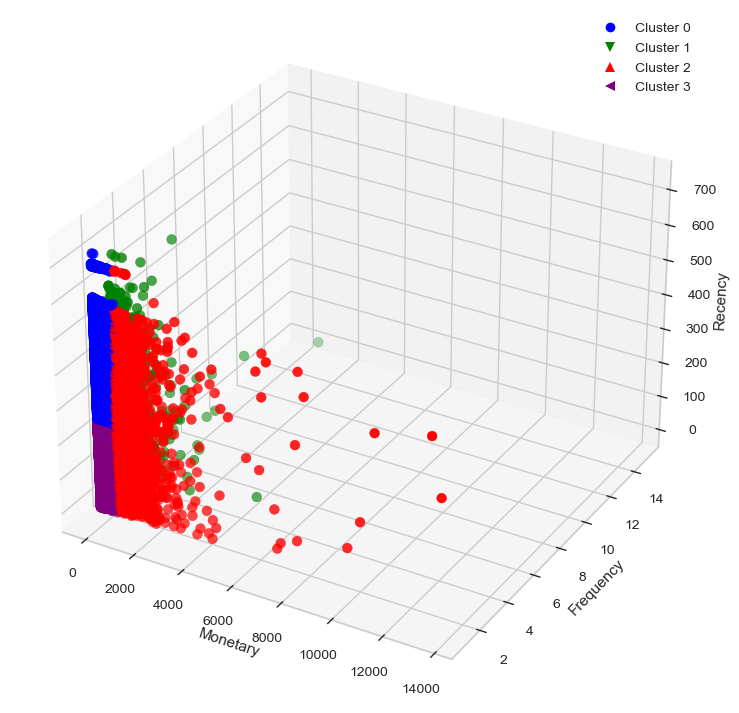

In [476]:
markers = ['o', 'v', '^', '<']  
fig1 = plt.figure(figsize=(18, 9)) 
ax = plt.axes(projection='3d') 

colors = {'0': 'blue', '1': 'green', '2': 'red', '3': 'purple'}

RFM_df['Cluster'] = RFM_df['Cluster'].astype(str)
ax.scatter3D(RFM_df['monetary'], RFM_df['frequency'], RFM_df['recency'], 
             c=RFM_df['Cluster'].apply(lambda x: colors[x]), 
             s=50)

ax.set_xlabel('Monetary') 
ax.set_ylabel('Frequency') 
ax.set_zlabel('Recency') 

legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4' ] 
legend_markers = [plt.Line2D([0,0],[0,0], color=color, marker=marker, linestyle='') for color, marker in zip(colors.values(), markers)]
ax.legend(legend_markers, legend_labels, numpoints=1) 
plt.savefig('my_figure2.png')

plt.show()


Nous pouvons voir que les clusters montrent un bon degré de séparation les uns des autres et que leur placement sur le graphique a du sens.

In [477]:
rfm_clusters_stat(RFM_df)

recency                         frequency                       
            std   mean median  min  max       std mean median min max   
Cluster                                                                 
0          97.0  392.0  379.0  261  728       0.0  1.0    1.0   1   1  \
1         144.0  224.0  203.0    0  696       0.0  2.0    2.0   2  15   
2         152.0  241.0  220.0    8  698       0.0  1.0    1.0   1   2   
3          72.0  131.0  132.0    4  261       0.0  1.0    1.0   1   1   

        monetary                                         
             std    mean  median    min      max  count  
Cluster                                                  
0          127.0   144.0   105.0   10.0    876.0  37796  
1          272.0   323.0   245.0   37.0   4656.0   2773  
2          964.0  1439.0  1156.0  780.0  13664.0   1880  
3          122.0   142.0   106.0   11.0    822.0  50947

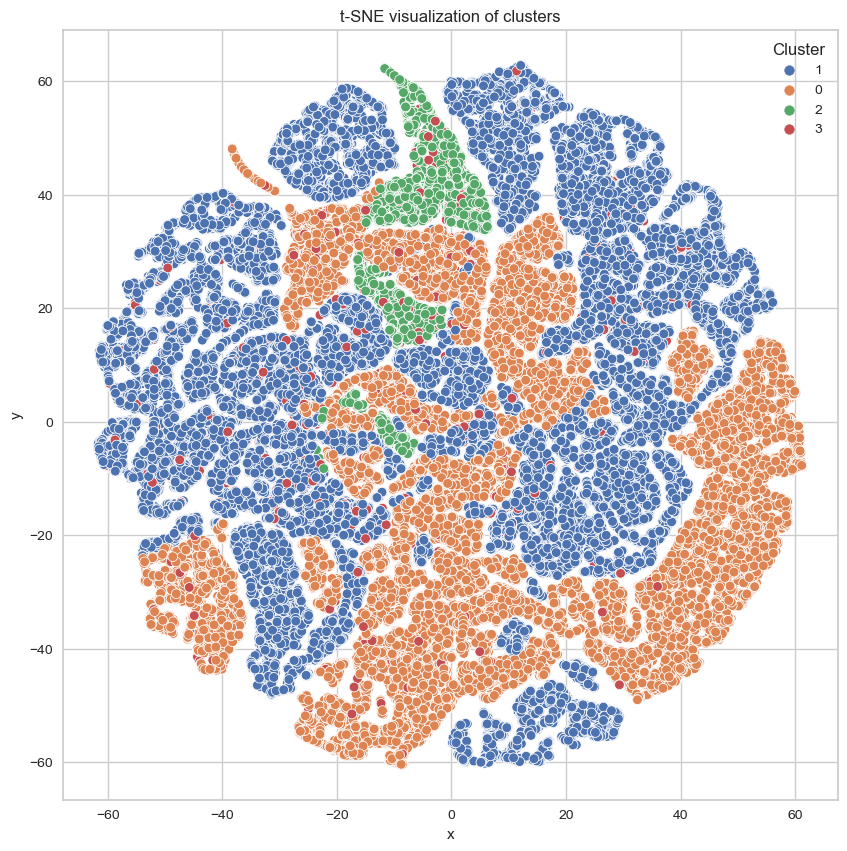

In [359]:
# TSNE model
model = TSNE(random_state=1)
transformed = model.fit_transform(RFM_df)


tsne_df = pd.DataFrame(
    np.column_stack((transformed, RFM_df['Cluster'])), 
    columns=["x", "y", "Cluster"]
)

plt.figure(figsize=(10,10))
sns.scatterplot(data=tsne_df, x='x', y='y', hue='Cluster', palette="deep")
plt.title('t-SNE visualization of clusters')
plt.savefig('my_figure3.png')
plt.show()


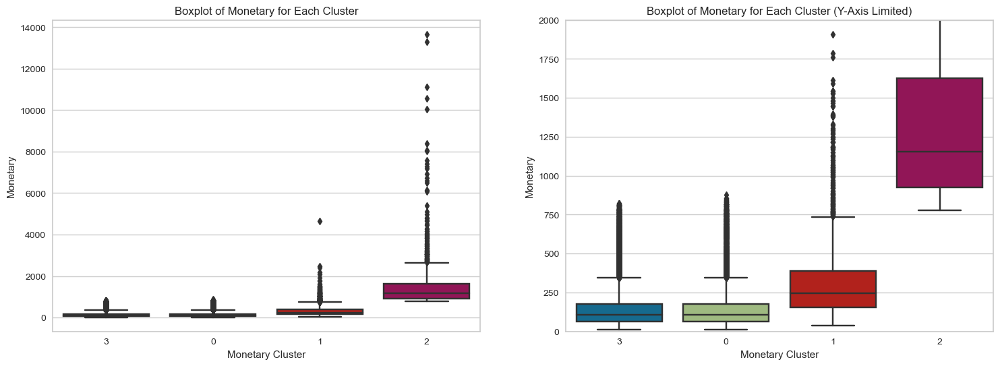

In [478]:
#Boxplot of Monetary for Each Cluster
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Boxplot for monetary cluster without limiting y-axis
sns.boxplot(x='Cluster', y='monetary', data=RFM_df, ax=axes[0])
axes[0].set_xlabel('Monetary Cluster')
axes[0].set_ylabel('Monetary')
axes[0].set_title('Boxplot of Monetary for Each Cluster')

# Boxplot for monetary cluster with y-axis limit
sns.boxplot(x='Cluster', y='monetary', data=RFM_df, ax=axes[1])
axes[1].set_xlabel('Monetary Cluster')
axes[1].set_ylabel('Monetary')
axes[1].set_title('Boxplot of Monetary for Each Cluster (Y-Axis Limited)')
axes[1].set_ylim(0, 2000)
plt.savefig('my_figure4.png')
plt.show()


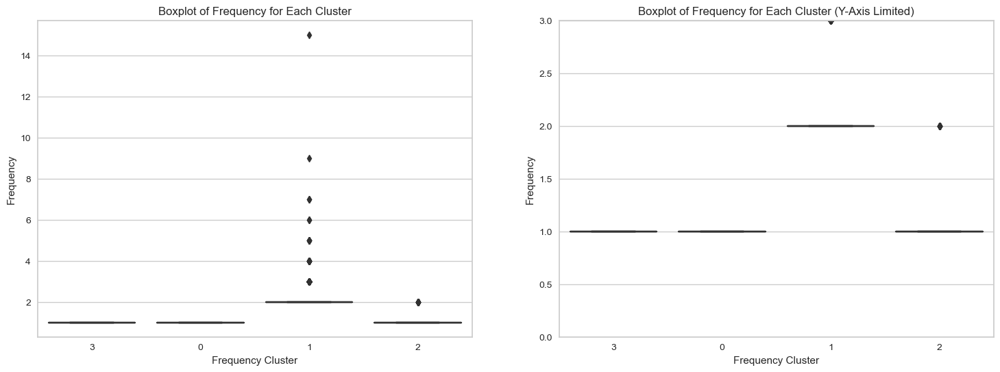

In [479]:
#Boxplot of Frequency for Each Cluster
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

#  without limiting y-axis
sns.boxplot(x='Cluster', y='frequency', data=RFM_df, ax=axes[0])
axes[0].set_xlabel('Frequency Cluster')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Boxplot of Frequency for Each Cluster')

# with y-axis limit
sns.boxplot(x='Cluster', y='frequency', data=RFM_df, ax=axes[1])
axes[1].set_xlabel('Frequency Cluster')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Boxplot of Frequency for Each Cluster (Y-Axis Limited)')
axes[1].set_ylim(0, 3)
plt.savefig('my_figure5.png')
plt.show()


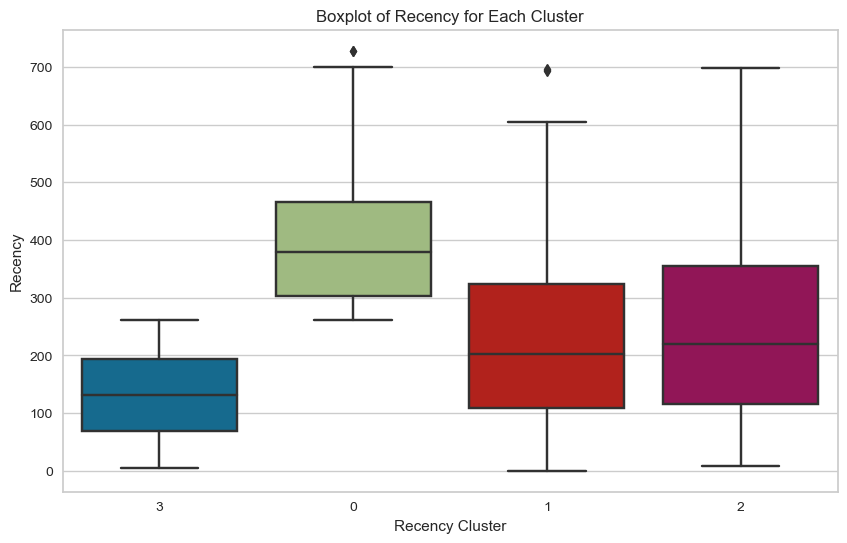

In [480]:
# Group the data by 'recency_cluster' and create a boxplot for each cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cluster', y='recency', data=RFM_df)
plt.xlabel('Recency Cluster')
plt.ylabel('Recency')
plt.title('Boxplot of Recency for Each Cluster')
plt.savefig('my_figure6.png')
plt.show()

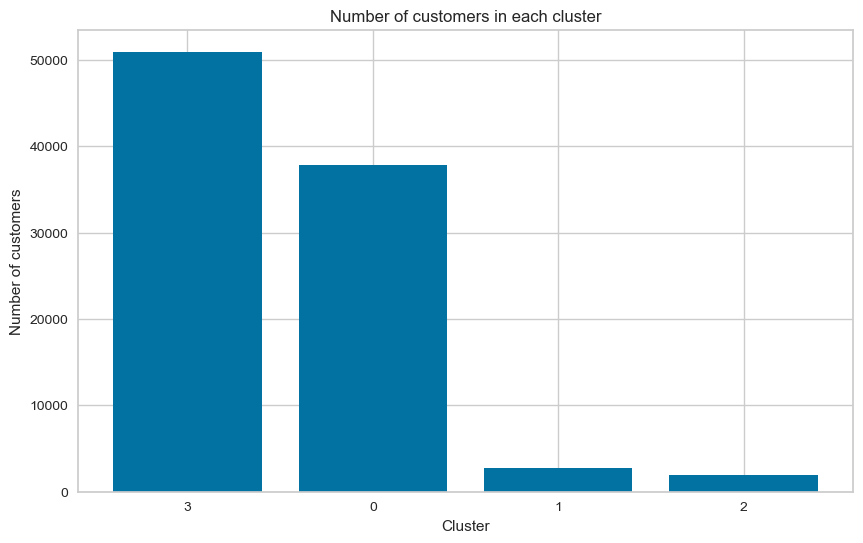

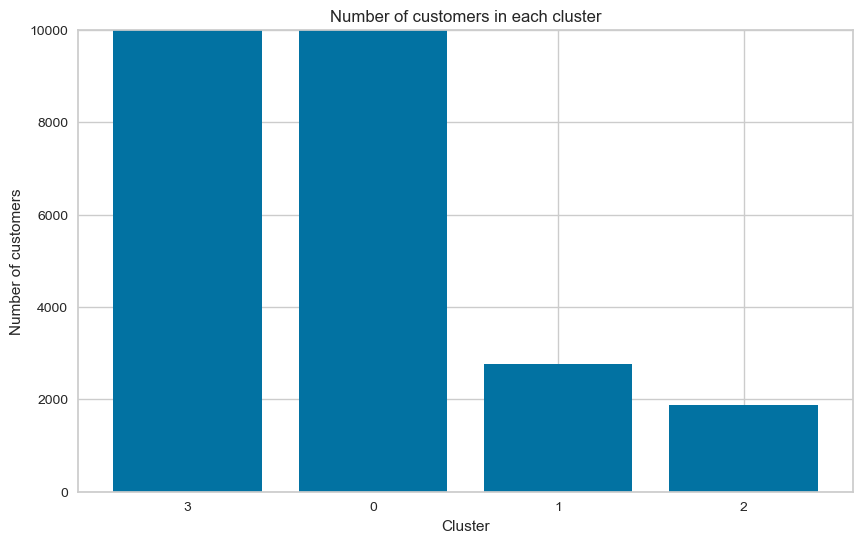

In [481]:
cluster_counts = RFM_df['Cluster'].value_counts()
plt.figure(figsize=(10, 6))
plt.bar(cluster_counts.index, cluster_counts.values)
plt.xlabel('Cluster')
plt.ylabel('Number of customers')
plt.title('Number of customers in each cluster')
plt.show()


cluster_counts = RFM_df['Cluster'].value_counts()
plt.figure(figsize=(10, 6))
plt.bar(cluster_counts.index, cluster_counts.values)
plt.ylim(0, 10000)
plt.xlabel('Cluster')
plt.ylabel('Number of customers')
plt.title('Number of customers in each cluster')
plt.savefig('my_figure7.png')
plt.show()


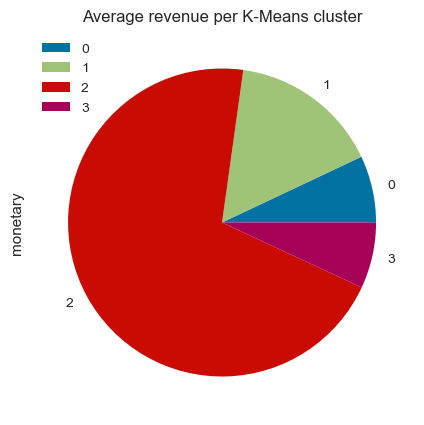

In [482]:
average_monetary_per_cluster = RFM_df.groupby('Cluster')['monetary'].mean()
average_monetary_per_cluster.plot(kind='pie', figsize=(10, 5), legend=True)
plt.title('Average revenue per K-Means cluster')
plt.savefig('my_figure11.png')
plt.show()


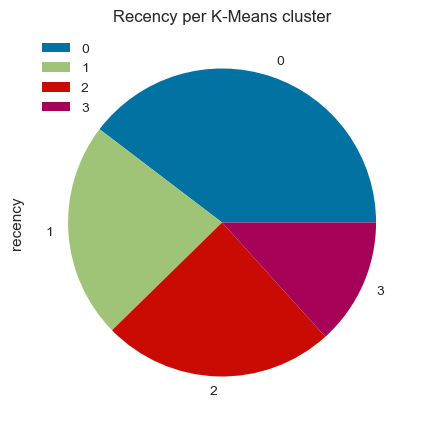

In [483]:
average_recency_per_cluster = RFM_df.groupby('Cluster')['recency'].mean()
average_recency_per_cluster.plot(kind='pie', figsize=(10, 5), legend=True)
plt.title('Recency per K-Means cluster')
plt.savefig('my_figure12.png')
plt.show()


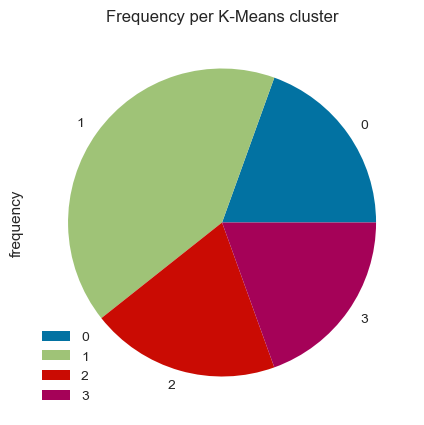

In [484]:
average_frequency_per_cluster = RFM_df.groupby('Cluster')['frequency'].mean()
average_frequency_per_cluster.plot(kind='pie', figsize=(10, 5), legend=True)
plt.title('Frequency per K-Means cluster')
plt.savefig('my_figure13.png')
plt.show()

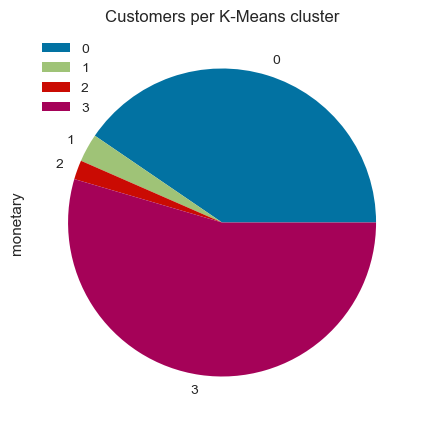

In [485]:
Customers_per_cluster = RFM_df.groupby('Cluster')['monetary'].count()
Customers_per_cluster.plot(kind='pie', figsize=(10, 5), legend=True)
plt.title('Customers per K-Means cluster')
plt.savefig('my_figure14.png')
plt.show()

In [486]:
colors = {'0': 'blue', '1': 'green', '2': 'red', '3': 'purple', '4': 'black'} 
RFM_df['color'] = RFM_df['Cluster'].map(colors)
x = RFM_df['recency']
y = RFM_df['frequency']
z = RFM_df['monetary']

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color=RFM_df['color'], 
        opacity=0.8
    )
)])

fig.update_layout(scene=dict(
    xaxis_title='Recency',
    yaxis_title='Frequency',
    zaxis_title='Monetary'
), width=700, margin=dict(r=20, b=10, l=10, t=10))


fig.show()


In [369]:
RFM_df=RFM_df.drop('color', axis=1)

# Cluster 1 - *Clients récents*
Ces clients ont récemment effectué leur achat, il peut donc être efficace de les cibler avec des campagnes promotionnelles pour de nouveaux produits ou offres, des campagnes marketing personnalisées pour augmenter leur rétention et les convertir en nos meilleurs clients.


# Cluster 2 - *VIP-clients*
Ces clients dépensent plus d'argent sur les achats. 
Ils doivent proposer des offres plus luxueuses, des niveaux d'abonnement plus élevés et des ventes croisées/incitatives qui augmentent la valeur moyenne des commandes. Là encore, il n'est peut-être pas logique d'augmenter les marges en offrant des remises.


# Cluster 3 - *Сlients réguliers*
Ces clients achètent plus souvent. 
Ils répondent mieux aux recommandations de produits basées sur les achats passés, ainsi qu'aux incitations à seuil (comme un cadeau gratuit pour les transactions supérieures à la valeur moyenne des commandes de la marque). Peut-être peuvent-ils être encouragés à acheter encore plus avec des offres spéciales pour les clients fidèles et à utiliser des campagnes de parrainage  afin d'attirer de nouveaux clients.


# Cluster 0 -  *Groupe de risque*
Étant donné que ces clients n'ont effectué qu'un seul achat il y a longtemps, une stratégie de récupération peut être utile. Par exemple, envoyez-leur des e-mails avec des rappels ou des offres spéciales pour les encourager à magasiner à nouveau.

# DBSCAN

In [385]:
param_grid = {'eps': [1.0, 1.5, 2], 'min_samples': [5, 10, 15]}

best_score = -1
best_params = {}

for params in ParameterGrid(param_grid):
    eps = params['eps']
    min_samples = params['min_samples']
    
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(RFM_standardized_data)
    
    silhouette_avg = silhouette_score(RFM_standardized_data, cluster_labels)
    
    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_params = params
    
    print(f"Parameters: eps={eps}, min_samples={min_samples}, Silhouette Score: {silhouette_avg}")

print("Best Parameters:", best_params)

best_eps = best_params['eps']
best_min_samples = best_params['min_samples']

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan.fit_predict(RFM_standardized_data)

silhouette_avg = silhouette_score(RFM_standardized_data, cluster_labels)
print("Silhouette Score:", silhouette_avg)

Parameters: eps=1.0, min_samples=5, Silhouette Score: 0.7185063307068553
Parameters: eps=1.0, min_samples=10, Silhouette Score: 0.7195066750767831
Parameters: eps=1.0, min_samples=15, Silhouette Score: 0.7187474619974995
Parameters: eps=1.5, min_samples=5, Silhouette Score: 0.7193420717107765
Parameters: eps=1.5, min_samples=10, Silhouette Score: 0.7194410471806447
Parameters: eps=1.5, min_samples=15, Silhouette Score: 0.7196035649174892
Parameters: eps=2, min_samples=5, Silhouette Score: 0.7184746051552116
Parameters: eps=2, min_samples=10, Silhouette Score: 0.7194337241768145
Parameters: eps=2, min_samples=15, Silhouette Score: 0.7194522949322083
Best Parameters: {'eps': 1.5, 'min_samples': 15}
Silhouette Score: 0.7196035649174892


In [386]:
dbscan = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])

labels_dbscan = dbscan.fit_predict(RFM_standardized_data)

RFM_standardized_data['Cluster_dbscan'] = labels_dbscan
RFM_standardized_data

,recency,frequency,monetary,Cluster_dbscan
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.827507,-0.160426,-0.122512,0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.807920,-0.160426,-0.558480,0
0000f46a3911fa3c0805444483337064,1.953827,-0.160426,-0.334130,0
0000f6ccb0745a6a4b88665a16c9f078,0.543573,-0.160426,-0.496036,0
0004aac84e0df4da2b147fca70cf8255,0.328117,-0.160426,0.086484,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1.366221,-0.160426,7.195644,0
fffea47cd6d3cc0a88bd621562a9d061,0.158365,-0.160426,-0.340363,0
ffff371b4d645b6ecea244b27531430a,2.156224,-0.160426,-0.234402,0


In [390]:
RFM_df['Cluster_dbscan'] = labels_dbscan

RFM_df

,recency,frequency,monetary,Cluster_dbscan
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,0
0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,0
0000f46a3911fa3c0805444483337064,541,1,86.22,0
0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,0
0004aac84e0df4da2b147fca70cf8255,292,1,196.89,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,451,1,2067.42,0
fffea47cd6d3cc0a88bd621562a9d061,266,1,84.58,0
ffff371b4d645b6ecea244b27531430a,572,1,112.46,0


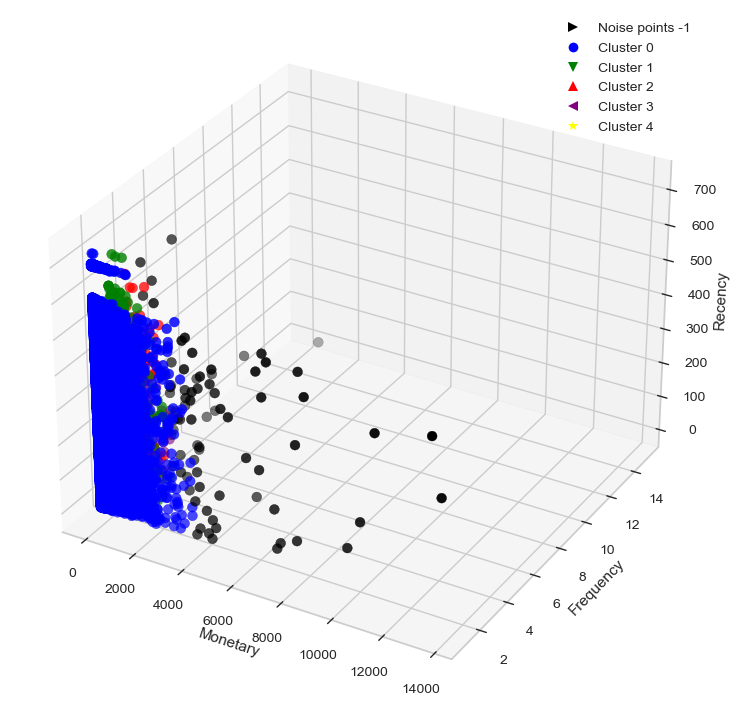

In [391]:
markers = ['>', 'o', 'v', '^', '<', '*']  
fig1 = plt.figure(figsize=(18, 9)) 
ax = plt.axes(projection='3d') 
#colors = {'-1': 'black', '0': 'blue', '1': 'green', '2': 'red', '3': 'purple'}
colors = {'-1': 'black', '0': 'blue', '1': 'green', '2': 'red', '3': 'purple', '4': 'yellow'}


#colors = {'0': 'blue', '1': 'green', '2': 'red', '3': 'purple'} 
RFM_df['Cluster_dbscan'] = RFM_df['Cluster_dbscan'].astype(str)
ax.scatter3D(RFM_df['monetary'], RFM_df['frequency'], RFM_df['recency'], 
             c=RFM_df['Cluster_dbscan'].apply(lambda x: colors[x]), 
             s=50)

ax.set_xlabel('Monetary') 
ax.set_ylabel('Frequency') 
ax.set_zlabel('Recency') 

legend_labels = ['Noise points -1', 'Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'] 
legend_markers = [plt.Line2D([0,0],[0,0], color=color, marker=marker, linestyle='') for color, marker in zip(colors.values(), markers)]
ax.legend(legend_markers, legend_labels, numpoints=1) 
plt.savefig('my_figure8.png')
plt.show()

In [ ]:
colors = {'-1': 'black', '0': 'blue', '1': 'green', '2': 'red', '3': 'purple', '4': 'yellow'}
RFM_df['color'] = RFM_df['Cluster_dbscan'].map(colors)
x = RFM_df['recency']
y = RFM_df['frequency']
z = RFM_df['monetary']

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color=RFM_df['color'], 
        opacity=0.8
    )
)])

fig.update_layout(scene=dict(
    xaxis_title='Recency',
    yaxis_title='Frequency',
    zaxis_title='Monetary'
), width=700, margin=dict(r=20, b=10, l=10, t=10))
plt.savefig('my_figure16.png')

fig.show()

In [394]:
def rfm_clusters_stat_dbscan(df):
    df_new = df.groupby(['Cluster_dbscan']).agg({
            'recency'  : ['std','mean','median', 'min', 'max'],
            'frequency': ['std','mean','median', 'min', 'max'],
            'monetary' : ['std','mean','median', 'min', 'max', 'count']
        }).round(0)

    return df_new

In [395]:
rfm_clusters_stat_dbscan(RFM_df)

recency                        frequency                       
                   std   mean median min  max       std mean median min max   
Cluster_dbscan                                                                
-1               189.0  266.0  221.0  11  605       2.0  3.0    2.0   1  15  \
0                153.0  242.0  223.0   4  728       0.0  1.0    1.0   1   1   
1                143.0  226.0  206.0   0  696       0.0  2.0    2.0   2   2   
2                151.0  212.0  170.0   5  605       0.0  3.0    3.0   3   3   
3                 99.0  127.0  109.0  12  348       0.0  4.0    4.0   4   4   

               monetary                                         
                    std    mean  median    min      max  count  
Cluster_dbscan                                                  
-1               3049.0  3918.0  3736.0   73.0  13664.0     79  
0                 219.0   166.0   108.0   10.0   3852.0  90552  
1                 271.0   315.0   235.0   37.0   2340.0   2570  
2                 296.0   452.0   371.0   47.0   1451.0    173  
3                 224.0   596.0   532.0  298.0   1056.0     22

In [399]:
RFM_df=RFM_df.drop('color', axis=1)
RFM_df

,recency,frequency,monetary,Cluster_dbscan
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,0
0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,0
0000f46a3911fa3c0805444483337064,541,1,86.22,0
0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,0
0004aac84e0df4da2b147fca70cf8255,292,1,196.89,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,451,1,2067.42,0
fffea47cd6d3cc0a88bd621562a9d061,266,1,84.58,0
ffff371b4d645b6ecea244b27531430a,572,1,112.46,0


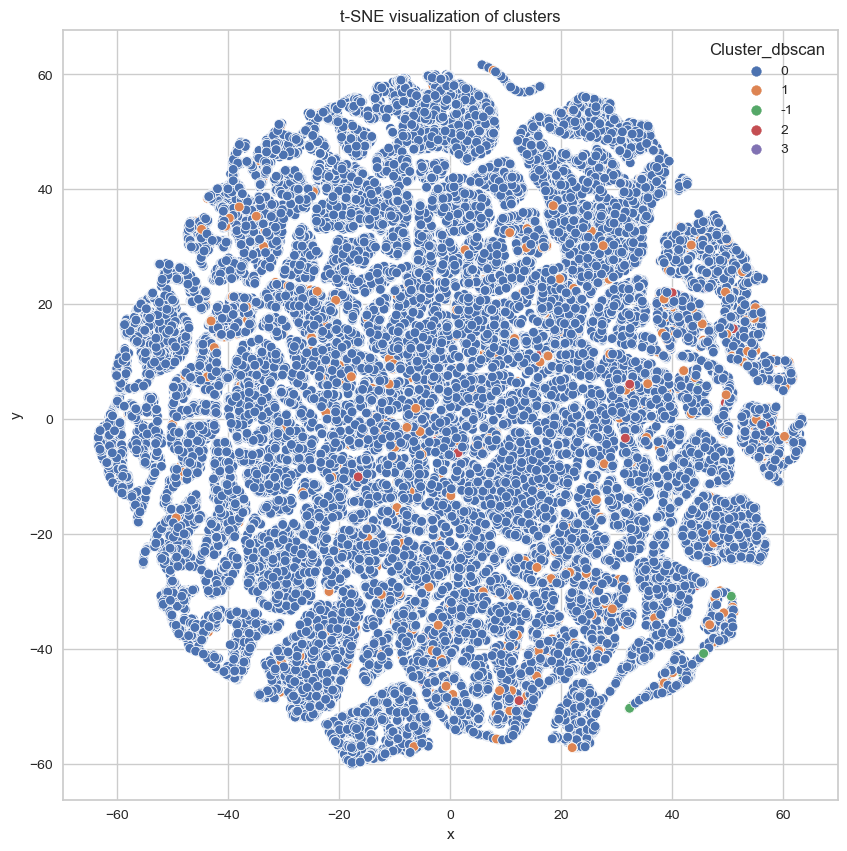

In [400]:
# TSNE model
model = TSNE(random_state=1)
transformed = model.fit_transform(RFM_df)


tsne_df = pd.DataFrame(
    np.column_stack((transformed, RFM_df['Cluster_dbscan'])), 
    columns=["x", "y", "Cluster_dbscan"]
)

plt.figure(figsize=(10,10))
sns.scatterplot(data=tsne_df, x='x', y='y', hue='Cluster_dbscan', palette="deep")
plt.title('t-SNE visualization of clusters')
plt.savefig('my_figure9.png')
plt.show()

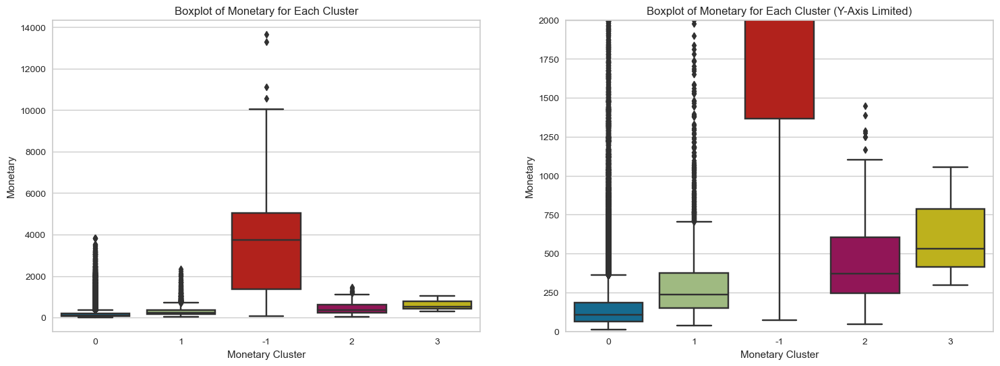

In [402]:
#Boxplot of Monetary for Each Cluster
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Boxplot for monetary cluster without limiting y-axis
sns.boxplot(x='Cluster_dbscan', y='monetary', data=RFM_df, ax=axes[0])
axes[0].set_xlabel('Monetary Cluster')
axes[0].set_ylabel('Monetary')
axes[0].set_title('Boxplot of Monetary for Each Cluster')

# Boxplot for monetary cluster with y-axis limit
sns.boxplot(x='Cluster_dbscan', y='monetary', data=RFM_df, ax=axes[1])
axes[1].set_xlabel('Monetary Cluster')
axes[1].set_ylabel('Monetary')
axes[1].set_title('Boxplot of Monetary for Each Cluster (Y-Axis Limited)')
axes[1].set_ylim(0, 2000)

plt.show()

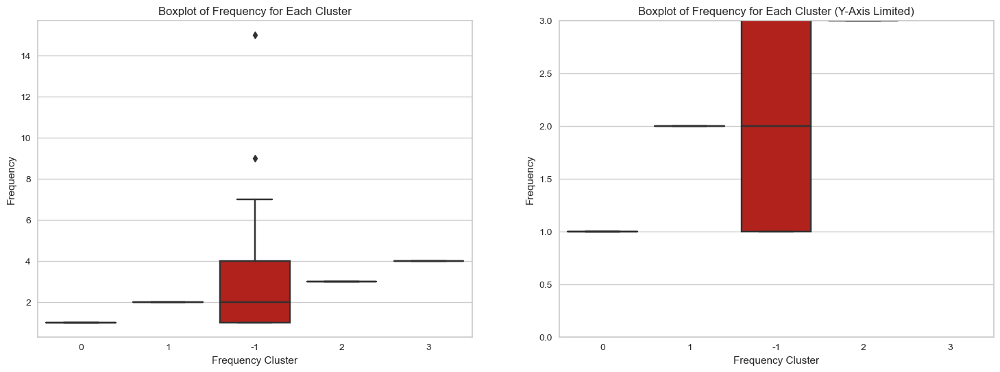

In [403]:
#Boxplot of Frequency for Each Cluster
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

#  without limiting y-axis
sns.boxplot(x='Cluster_dbscan', y='frequency', data=RFM_df, ax=axes[0])
axes[0].set_xlabel('Frequency Cluster')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Boxplot of Frequency for Each Cluster')

# with y-axis limit
sns.boxplot(x='Cluster_dbscan', y='frequency', data=RFM_df, ax=axes[1])
axes[1].set_xlabel('Frequency Cluster')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Boxplot of Frequency for Each Cluster (Y-Axis Limited)')
axes[1].set_ylim(0, 3)

plt.show()

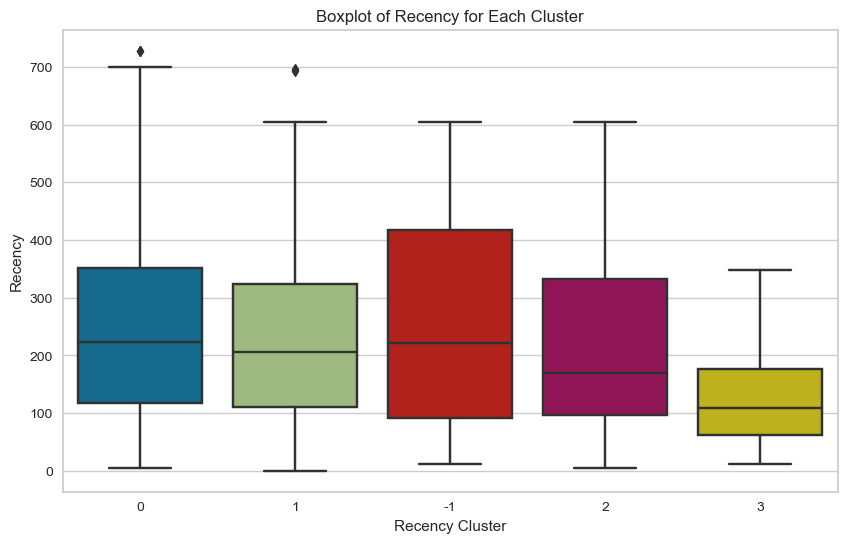

In [404]:
# Group the data by 'recency_cluster' and create a boxplot for each cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cluster_dbscan', y='recency', data=RFM_df)
plt.xlabel('Recency Cluster')
plt.ylabel('Recency')
plt.title('Boxplot of Recency for Each Cluster')
plt.show()